# Concevez une application au service de la santé publique

**Objectif:**
L'agence "Santé publique France" a lancé un appel à projets pour trouver des idées innovantes d’applications en lien avec l'alimentation. Trouver une idée d'application lié à la santé publique

Le jeu de données vient de Open Food Fact 

**Les champs sont séparés en quatre sections :**

- Les informations générales sur la fiche du produit : nom, date de modification, etc
- Un ensemble de tags : catégorie du produit, localisation, origine, etc
- Les ingrédients composant les produits et leurs additifs éventuels
- Des informations nutritionnelles : quantité en grammes d’un nutriment pour 100 grammes du produit

**Votre mission :**


1. Traiter le jeu de données afin de repérer des variables pertinentes pour les traitements à venir. Automatiser ces traitements pour éviter de répéter ces opérations.

2. Tout au long de l’analyse, produire des visualisations afin de mieux comprendre les données. Effectuer une analyse univariée pour chaque variable intéressante, afin de synthétiser son comportement.

3. Confirmer ou infirmer les hypothèses  à l’aide d’une analyse multivariée. Effectuer les tests statistiques appropriés pour vérifier la significativité des résultats.

4. Élaborer une idée d’application. Identifier des arguments justifiant la faisabilité (ou non) de l’application à partir des données Open Food Facts.

5. Rédiger un rapport d’exploration et pitcher votre idée durant la soutenance du projet.

In [1]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew
from scipy.stats import kurtosis
import plotly.express as px
from pylab import *
from sklearn.model_selection import train_test_split
from sklearn import decomposition
from sklearn import preprocessing
import texthero as hero
from IPython.display import Image, HTML
from wordcloud import WordCloud, STOPWORDS
from matplotlib.collections import LineCollection
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from nltk.corpus import stopwords
# options pandas pour lire entièrement les fichiers au moins jusqu'à 999 lignes et 999 colonnes
pd.options.display.max_rows = 500000
pd.options.display.max_columns = 500000


In [2]:
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7,6))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

In [3]:
naValues = ['nan','unknown']
chunksize = 100000
chunks = []

for chunk in pd.read_csv('en.openfoodfacts.org.products.csv',sep='\t',encoding="utf-8",na_values=naValues,
                         chunksize=chunksize,low_memory=False):
    chunks.append(chunk)

data = pd.concat(chunks,axis=0)

In [4]:
data.head(5)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,packaging_text,brands,brands_tags,categories,categories_tags,categories_en,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_en,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_en,ingredients_text,allergens,allergens_en,traces,traces_tags,traces_en,serving_size,serving_quantity,no_nutriments,additives_n,additives,additives_tags,additives_en,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutriscore_score,nutriscore_grade,nova_group,pnns_groups_1,pnns_groups_2,states,states_tags,states_en,brand_owner,main_category,main_category_en,image_url,image_small_url,image_ingredients_url,image_ingredients_small_url,image_nutrition_url,image_nutrition_small_url,energy-kj_100g,energy-kcal_100g,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,-butyric-acid_100g,-caproic-acid_100g,-caprylic-acid_100g,-capric-acid_100g,-lauric-acid_100g,-myristic-acid_100g,-palmitic-acid_100g,-stearic-acid_100g,-arachidic-acid_100g,-behenic-acid_100g,-lignoceric-acid_100g,-cerotic-acid_100g,-montanic-acid_100g,-melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,-alpha-linolenic-acid_100g,-eicosapentaenoic-acid_100g,-docosahexaenoic-acid_100g,omega-6-fat_100g,-linoleic-acid_100g,-arachidonic-acid_100g,-gamma-linolenic-acid_100g,-dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,-oleic-acid_100g,-elaidic-acid_100g,-gondoic-acid_100g,-mead-acid_100g,-erucic-acid_100g,-nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,-sucrose_100g,-glucose_100g,-fructose_100g,-lactose_100g,-maltose_100g,-maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,-soluble-fiber_100g,-insoluble-fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,fruits-vegetables-nuts-dried_100g,fruits-vegetables-nuts-estimate_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,carbon-footprint-from-meat-or-fish_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g,choline_100g,phylloquinone_100g,beta-glucan_100g,inositol_100g,carnitine_100g
0,0000000000017,http://world-en.openfoodfacts.org/product/0000...,kiliweb,1529059080,2018-06-15T10:38:00Z,1561463718,2019-06-25T11:55:18Z,Vitória crackers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-complet...","en:to-be-completed,en:nutrition-facts-complete...","To be completed,Nutrition facts completed,Ingr...",NaN,NaN,NaN,https://static.openfoodfacts.org/images/produc...,https://static.openfoodfacts.org/images/produc...,https://static.openfoodfacts.org/images/produc...,https://static.openfoodfacts.org/images/produc...,NaN,NaN,NaN,375.0,1569.0,NaN,7.0,3.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.1,15.0,NaN,NaN,NaN,NaN,NaN,NaN

## Un peu de documentation

Ce jeu de donnée informe sur pleins de caractéristiques de produits alimentaire et entre autre le nutriscore, mais il y a aussi la provenance des ingrédients, la marque du produits, les teneurs nutritionnelles sur 100g...

Je vais me focaliser sur l'analyse de donnée autour du nutriscore!

Qu’est-ce que le Nutri-Score ?

C'est un logo qui est apposé sur les emballages. Il a pour but de rendre plus lisible et compréhensible l’étiquetage nutritionnel.
Conçu dans le cadre du Programme National Nutrition Santé, le Nutri-Score fait ainsi progressivement son apparition dans les rayons.
Le Nutri-Score est donc un logo qui indique la qualité nutritionnelle des aliments avec des notes allant de A à E. Avec le NutriScore, les produits peuvent être facilement et rapidement comparés.

La note Nutri-Score est déterminée par la quantité de nutriments bons et mauvais pour la santé :

- Points négatifs : l'énergie, les graisses saturées, les sucres, et le sodium (des niveaux élevés sont considérés comme mauvais pour la santé)

- Points positifs : la proportion de fruits, de légumes, de noix, d'huiles d'olive, de colza et de noix, de fibres et de protéines (les niveaux élevés sont considérés comme bons pour la santé)


![texte](nutri-score.png)

## Nettoyage et traitements des valeurs manquantes

In [5]:
#Nombre de lignes et de colonnes du dataset
data.shape

(1486047, 182)

In [6]:
round(data.isnull().sum().sum()/data.size *100)

80.0

Mon jeu de donnée contient 1486047 lignes et 182 colonnes avec 80% de valeurs manquantes

In [7]:
data["product_name"].value_counts().sum().sum()

1417962

On remarque qu'il y a moins de noms de produits que de lignes... Je supprime donc les lignes ou il n'est pas indiqué de noms de produits

In [8]:
#je supprime uniquement les lignes dont les noms de produits sont manquants
dt = data.dropna(subset=['product_name'])

In [9]:
dt.shape

(1417962, 182)

In [10]:
#Il n'y a pas le descritpif de pnns_group_1 dans le fichier descritpifs des variables https://world.openfoodfacts.org/data/data-fields.txt
dt["pnns_groups_1"].value_counts()

Sugary snacks              125335
Milk and dairy products     76543
Fish Meat Eggs              71689
Cereals and potatoes        68809
Fat and sauces              59632
Beverages                   59102
Composite foods             47071
Fruits and vegetables       40125
Salty snacks                27830
fruits-and-vegetables        6807
sugary-snacks                4375
cereals-and-potatoes           55
salty-snacks                    5
Name: pnns_groups_1, dtype: int64

In [11]:
GroupeProduit = data["pnns_groups_1"].value_counts()

In [12]:
plt.figure(figsize = (10,9))
fig = px.pie(GroupeProduit, values='pnns_groups_1', names=GroupeProduit.index, title='Les produits catégorisé dans des différents groupes')
fig.show()

<Figure size 720x648 with 0 Axes>

Les 3 catégories de produits contenants le plus de produits sont les "sugary snacks", "Mils and dairy products" puis les "Fish Meat Eggs"

In [13]:
#pnn_group_2 représente les sous-groupe des groupes de produits
dt["pnns_groups_2"].value_counts()

Sweets                              57924
Biscuits and cakes                  54957
Dressings and sauces                43107
Cheese                              37096
One-dish meals                      37076
Cereals                             33436
Milk and yogurt                     28691
Processed meat                      27999
Meat                                20067
Sweetened beverages                 19734
Fish and seafood                    19621
Vegetables                          18732
Bread                               18683
Fats                                16525
Fruits                              14200
Alcoholic beverages                 12987
Chocolate products                  12454
Salty and fatty products            12088
Unsweetened beverages                9790
Appetizers                           9624
Artificially sweetened beverages     8745
Fruit juices                         7637
Legumes                              7191
Breakfast cereals                 

In [14]:
#Valeur unique des deux colonnes "pnns_group_1" et "pnns_group_2"
Categories = dt.groupby(['pnns_groups_1', 'pnns_groups_2']).size().reset_index().loc[:, ['pnns_groups_1', 'pnns_groups_2']]
Categories

,pnns_groups_1,pnns_groups_2
0,Beverages,Artificially sweetened beverages
1,Beverages,Fruit juices
2,Beverages,Fruit nectars
3,Beverages,Plant-based milk substitutes
4,Beverages,Sweetened beverages
5,Beverages,Teas and herbal teas and coffees
6,Beverages,Unsweetened beverages
7,Beverages,Waters and flavored waters
8,Cereals and potatoes,Bread
9,Cereals and potatoes,Breakfast cereals


In [15]:
print(dt["nutriscore_grade"].shape)
print(dt["nutriscore_score"].shape)

(1417962,)
(1417962,)


In [16]:
nutriscore = dt.groupby(["nutriscore_grade","nutriscore_score"]).size().reset_index().loc[:,["nutriscore_grade","nutriscore_score"]]
nutriscore

,nutriscore_grade,nutriscore_score
0,a,-15.0
1,a,-14.0
2,a,-13.0
3,a,-12.0
4,a,-11.0
5,a,-10.0
6,a,-9.0
7,a,-8.0
8,a,-7.0
9,a,-6.0


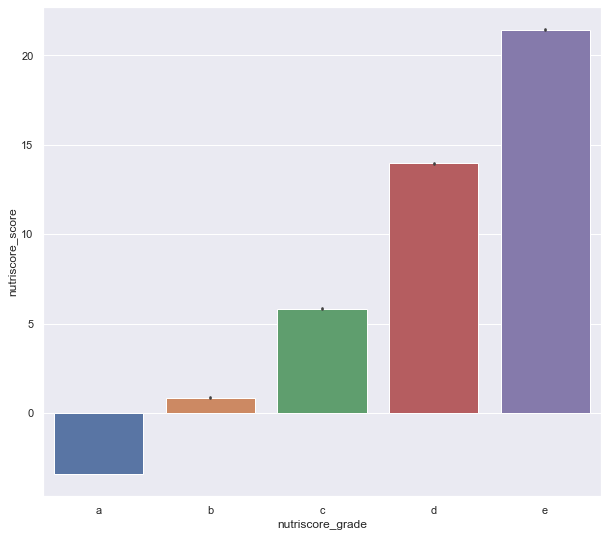

In [17]:
plt.figure(figsize = (10,9))
sns.set()
sns.barplot(y= dt["nutriscore_score"], x=  dt["nutriscore_grade"], data = dt, order = ["a","b","c","d","e"])
plt.show()

In [18]:
plt.figure(figsize = (10,9))
fig = px.pie(dt["nutriscore_grade"].dropna(), names='nutriscore_grade',title = "Répartitions des grades du nutriscore ")
fig.show()

<Figure size 720x648 with 0 Axes>

On remarque que les catégories **c** et **d** sont les plus nombreux. On peut en déduire grace à ce jeu de données qu'il y a plus de produits mal notés que de produits bien noté nutritionnelement.

In [19]:
round(dt["nutriscore_score"].isnull().sum()/dt["nutriscore_score"].size*100)

58.0

In [20]:
round(dt["nutriscore_grade"].isnull().sum()/dt["nutriscore_grade"].size*100)

58.0

58% de valeurs manquantes pour le nutriscore. On déduits que 42% des produits possède une notation nutriscore

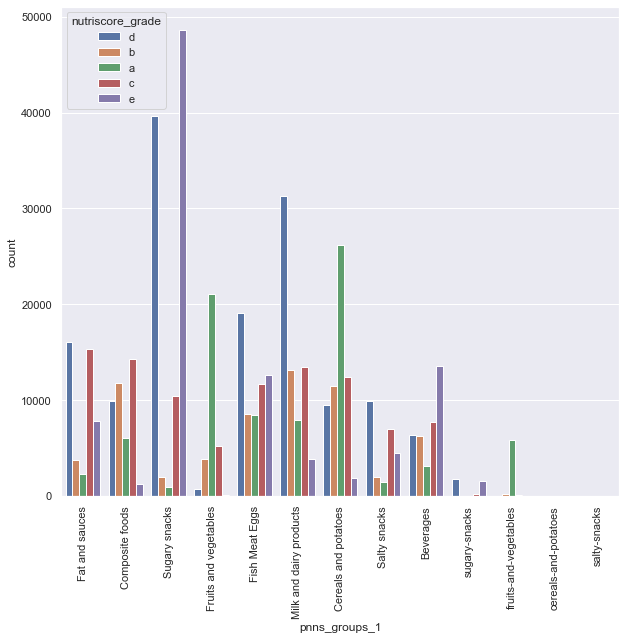

In [21]:
#Je veux extraire une catégorie d'aliment assez fournit en produit noté avec le nutriscore pour alimenter l'apprentissage
ax = plt.figure(figsize = (10, 9))
ax = sns.countplot(x="pnns_groups_1"  ,hue = "nutriscore_grade", data = dt)
ax = plt.xticks(rotation=90)
plt.show()

Dans cet histogramme, on remarque plusieurs catégories avec des aliments noté a,b,c,d,e et bien équilibrée comme : composites food, Milk and dairy products, cereals and potatoes. 
Moi je choisi les composites food. Ce sont des produits déjà préparé qui se vendent dans le commerce. 

J'extrait donc les données pour la catégories "composites food" :

In [22]:
#Je choisis comme catégories les produits préparés, j' extrait donc tous les ces produits
Produit_prep = dt.loc[dt["pnns_groups_1"] == "Composite foods"]

In [23]:
Produit_prep.shape

(47071, 182)

In [24]:
#selectionner les colonnes numeriques
Produit_prep_numerique0 = Produit_prep.select_dtypes(include=[np.number])
num_cols0 = Produit_prep_numerique0.columns.values
print(num_cols0)

['created_t' 'last_modified_t' 'cities' 'allergens_en' 'serving_quantity'
 'no_nutriments' 'additives_n' 'additives' 'ingredients_from_palm_oil_n'
 'ingredients_from_palm_oil' 'ingredients_that_may_be_from_palm_oil_n'
 'ingredients_that_may_be_from_palm_oil' 'nutriscore_score' 'nova_group'
 'energy-kj_100g' 'energy-kcal_100g' 'energy_100g' 'energy-from-fat_100g'
 'fat_100g' 'saturated-fat_100g' '-butyric-acid_100g' '-caproic-acid_100g'
 '-caprylic-acid_100g' '-capric-acid_100g' '-lauric-acid_100g'
 '-myristic-acid_100g' '-palmitic-acid_100g' '-stearic-acid_100g'
 '-arachidic-acid_100g' '-behenic-acid_100g' '-lignoceric-acid_100g'
 '-cerotic-acid_100g' '-montanic-acid_100g' '-melissic-acid_100g'
 'monounsaturated-fat_100g' 'polyunsaturated-fat_100g' 'omega-3-fat_100g'
 '-alpha-linolenic-acid_100g' '-eicosapentaenoic-acid_100g'
 '-docosahexaenoic-acid_100g' 'omega-6-fat_100g' '-linoleic-acid_100g'
 '-arachidonic-acid_100g' '-gamma-linolenic-acid_100g'
 '-dihomo-gamma-linolenic-acid_100g'

In [25]:
# selectionner les colonnes catégorielles
Produit_prep_categ0 = Produit_prep.select_dtypes(exclude=[np.number])
categ_cols0 = Produit_prep_categ0.columns.values
print(categ_cols0)

['code' 'url' 'creator' 'created_datetime' 'last_modified_datetime'
 'product_name' 'generic_name' 'quantity' 'packaging' 'packaging_tags'
 'packaging_text' 'brands' 'brands_tags' 'categories' 'categories_tags'
 'categories_en' 'origins' 'origins_tags' 'manufacturing_places'
 'manufacturing_places_tags' 'labels' 'labels_tags' 'labels_en'
 'emb_codes' 'emb_codes_tags' 'first_packaging_code_geo' 'cities_tags'
 'purchase_places' 'stores' 'countries' 'countries_tags' 'countries_en'
 'ingredients_text' 'allergens' 'traces' 'traces_tags' 'traces_en'
 'serving_size' 'additives_tags' 'additives_en'
 'ingredients_from_palm_oil_tags'
 'ingredients_that_may_be_from_palm_oil_tags' 'nutriscore_grade'
 'pnns_groups_1' 'pnns_groups_2' 'states' 'states_tags' 'states_en'
 'brand_owner' 'main_category' 'main_category_en' 'image_url'
 'image_small_url' 'image_ingredients_url' 'image_ingredients_small_url'
 'image_nutrition_url' 'image_nutrition_small_url' 'carbon-footprint_100g']


### Traitement des valeurs manquantes

In [26]:
Produit_prep.isnull().sum().sort_values()

code                                              0
categories_en                                     0
categories_tags                                   0
categories                                        0
pnns_groups_1                                     0
pnns_groups_2                                     0
states                                            0
states_tags                                       0
main_category                                     0
states_en                                         0
product_name                                      0
last_modified_datetime                            0
last_modified_t                                   0
created_datetime                                  0
created_t                                         0
creator                                           0
url                                               0
main_category_en                                  0
countries_tags                                   47
countries_en

In [27]:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df) #pourcentage de valeurs manquantes
        
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)# concaténation du nombre de valeur manquante et des pourcentages respectifq
        
        mis_val_table_ren_columns = mis_val_table.rename(columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        mis_val_table_ren_columns = mis_val_table_ren_columns[mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        
        return mis_val_table_ren_columns

In [28]:
missing_values_table(Produit_prep)

Your selected dataframe has 182 columns.
There are 164 columns that have missing values.


,Missing Values,% of Total Values
-gamma-linolenic-acid_100g,47071,100.0
-lignoceric-acid_100g,47071,100.0
-mead-acid_100g,47071,100.0
-gondoic-acid_100g,47071,100.0
-elaidic-acid_100g,47071,100.0
omega-9-fat_100g,47071,100.0
-dihomo-gamma-linolenic-acid_100g,47071,100.0
-melissic-acid_100g,47071,100.0
-montanic-acid_100g,47071,100.0
-stearic-acid_100g,47071,100.0


In [29]:
#Je supprime les colonnes avec 70% de valeurs manquantes
def supprimer_valeur_manquante(df):
    column_with_nan = df.columns[df.isnull().any()]
    for column in column_with_nan:
         if df[column].isnull().sum()*100.0/df.shape[0] > 70:
                 df.drop(column,1, inplace=True)

In [30]:
supprimer_valeur_manquante(Produit_prep)

C:\Users\agar.blohorn\anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
Produit_prep.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name', 'quantity',
       'packaging', 'packaging_tags', 'brands', 'brands_tags', 'categories',
       'categories_tags', 'categories_en', 'labels', 'labels_tags',
       'labels_en', 'stores', 'countries', 'countries_tags', 'countries_en',
       'ingredients_text', 'allergens', 'serving_size', 'serving_quantity',
       'additives_n', 'additives_tags', 'additives_en',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutriscore_score',
       'nutriscore_grade', 'nova_group', 'pnns_groups_1', 'pnns_groups_2',
       'states', 'states_tags', 'states_en', 'brand_owner', 'main_category',
       'main_category_en', 'image_url', 'image_small_url',
       'image_ingredients_url', 'image_ingredients_small_url',
       'image_nutrition_url', 'image_nutrition_small_url', 'energy-kcal_100g',
       'energy_100g', 'fat_100g', 'satu

In [32]:
#je supprime les colonnes qui ne sert pas a mon projet
suppr = ['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'quantity',
       'packaging', 'packaging_tags','brands_tags', 'categories',
       'categories_tags', 'labels', 'labels_tags',
       'labels_en', 'stores', 'countries', 'countries_tags','serving_size', 'serving_quantity',
       'additives_n', 'additives_tags',  'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n','nova_group', 'pnns_groups_1', 'states', 'states_tags', 'states_en', 'brand_owner', 'main_category',
       'main_category_en', 'image_url', 'image_small_url',
       'image_ingredients_url', 'image_ingredients_small_url',
       'image_nutrition_url', 'image_nutrition_small_url' ]
Produit_prep.drop(suppr, axis='columns', inplace=True)

Je supprime les colonnes qui ne me servent pas dans l'avancement du projet prédiction des notes nurtiscore pour les produits préparés. Ces colonnes traitent essenttiellement des caractéristiques sur les codes de pays pour la provenance des produits, les tags des marques, les tags des catégories d'aliments, l'url des images des produits, l'url des images des ingrédients des produits.. les additifs.. la présence ou non de l'huile de palme.

In [33]:
Produit_prep.isna().sum()

product_name                   0
brands                     12195
categories_en                  0
countries_en                  47
ingredients_text           10819
allergens                  27754
additives_en               21238
nutriscore_score            3779
nutriscore_grade            3779
pnns_groups_2                  0
energy-kcal_100g            8415
energy_100g                 2197
fat_100g                    2324
saturated-fat_100g          2578
trans-fat_100g             32270
cholesterol_100g           31995
carbohydrates_100g          2332
sugars_100g                 2557
fiber_100g                 17919
proteins_100g               2251
salt_100g                   2475
sodium_100g                 2475
calcium_100g               32091
iron_100g                  31996
nutrition-score-fr_100g     3779
dtype: int64

In [34]:
Produit_prep.shape

(47071, 25)

### Traitement des valeurs aberrantes

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



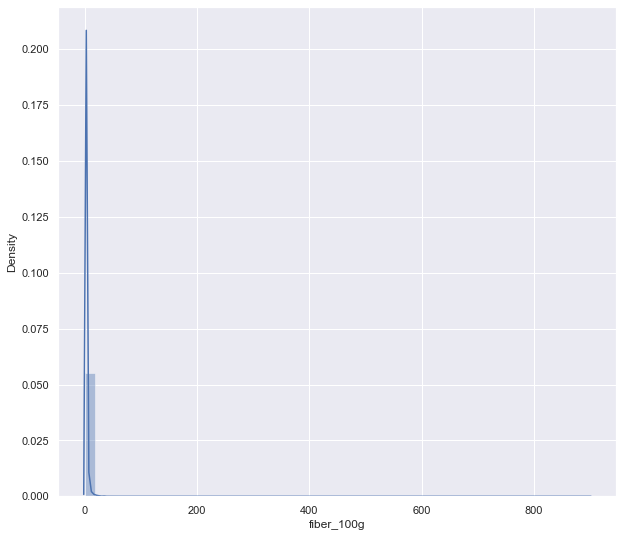

In [35]:
plt.figure(figsize = (10,9))
sns.distplot(Produit_prep["fiber_100g"])
plt.show()

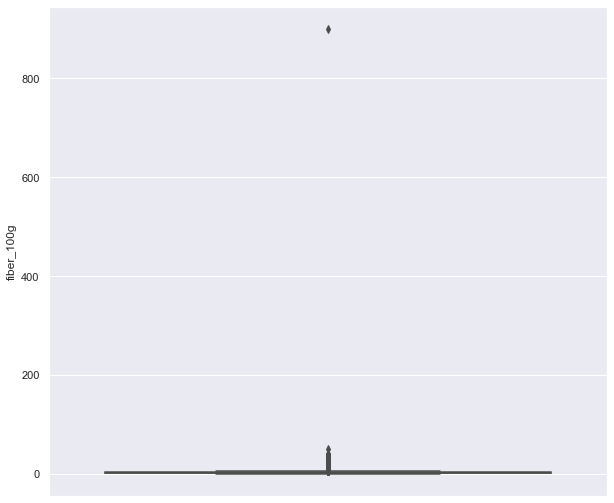

In [36]:
plt.figure(figsize = (10,9))
sns.boxplot( y=Produit_prep["fiber_100g"] )
plt.show()

La distribution pour la teneur en fibre est biaisé par une valeur aberrante car elle est supérieur a 100g. Regardons grâce a describe les grandeurs statistiques des autres variables.

In [37]:
Produit_prep.describe()

,nutriscore_score,energy-kcal_100g,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
count,43292.000000,38656.000000,44874.000000,44747.000000,44493.000000,14801.000000,15076.000000,44739.000000,44514.000000,29152.000000,44820.000000,44596.000000,44596.000000,14980.000000,15075.000000,43292.000000
mean,5.314100,187.397815,776.788005,7.672972,2.562076,0.024595,0.052945,19.746053,3.058768,2.083399,7.888723,1.522102,0.608845,0.099340,0.005261,5.314100
std,6.242434,203.809301,801.435897,7.813787,3.400469,0.181376,1.655523,19.055001,4.486522,5.813261,13.166527,14.410494,5.760973,3.248364,0.309870,6.242434
min,-12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-12.000000
25%,1.000000,101.000000,431.000000,2.900000,0.600000,0.000000,0.000000,7.400000,0.900000,0.800000,4.000000,0.720000,0.288000,0.014000,0.000430,1.000000
50%,3.000000,167.000000,699.000000,6.360000,1.700000,0.000000,0.009000,15.000000,2.000000,1.500000,7.100000,1.000000,0.400000,0.034000,0.000960,3.000000
75%,11.000000,247.000000,1021.000000,10.270000,3.600000,0.000000,0.024000,26.000000,3.500000,2.500000,10.600000,1.400000,0.560000,0.109000,0.001820,11.000000
max,32.000000,25710.000000,107571.000000,750.000000,400.000000,5.770000,116.915000,1400.000000,200.000000,900.000000,2500.000000,2100.000000,841.000000,385.000000,32.000000,32.000000


Les quantités des ingrédients nutritifs comme les fibres, les calories ou les graisses saturés sont données sur une quantité de 100g. On voit sur le tableau que les valeurs maximales sont pour beaucoup de colonnes supérieur à 100g... Je vais traiter toutes ces valeurs abberrantes. Ces valeurs faussent la représentation des distributions et empêche l'utilisation d'un algorithme d'apprentissage.

In [38]:
Produit_prep.columns

Index(['product_name', 'brands', 'categories_en', 'countries_en',
       'ingredients_text', 'allergens', 'additives_en', 'nutriscore_score',
       'nutriscore_grade', 'pnns_groups_2', 'energy-kcal_100g', 'energy_100g',
       'fat_100g', 'saturated-fat_100g', 'trans-fat_100g', 'cholesterol_100g',
       'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
       'salt_100g', 'sodium_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g'],
      dtype='object')

In [39]:
Produit_prep[Produit_prep["fat_100g"]<=100]["fat_100g"].median()

6.36

In [40]:
#Je selectionne les colonnes ou je doit nettoyer les valeur aberrantes. Je remplace ces valeurs par la médiane
liste_colonnes = ['fat_100g', 'saturated-fat_100g',
       'trans-fat_100g', 'cholesterol_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'calcium_100g', 'iron_100g', 'nutrition-score-fr_100g']

for col in liste_colonnes:
        Produit_prep[col][Produit_prep[col] >100 ] = Produit_prep[Produit_prep[col]<=100][col].median()        

<ipython-input-40-5f9601a0b725>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\agar.blohorn\anaconda3\lib\site-packages\pandas\core\series.py:1020: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-40-5f9601a0b725>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\agar.blohorn\anaconda3\lib\site-packages\pandas\core\series.py:1020: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice 

In [41]:
Produit_prep.loc[432697]

product_name                         tartelettes à la Fraise
brands                                                  €co+
categories_en              Pies,Tartlets,Strawberry tartlets
countries_en                                          France
ingredients_text                                         NaN
allergens                                                NaN
additives_en                                             NaN
nutriscore_score                                         NaN
nutriscore_grade                                         NaN
pnns_groups_2                          Pizza pies and quiche
energy-kcal_100g                                         435
energy_100g                                             1820
fat_100g                                                  13
saturated-fat_100g                                       NaN
trans-fat_100g                                           NaN
cholesterol_100g                                         NaN
carbohydrates_100g      

In [42]:
som = Produit_prep[['fat_100g', 'saturated-fat_100g',
       'trans-fat_100g', 'cholesterol_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'calcium_100g', 'iron_100g']].sum(axis=1)


In [43]:
Produit_prep.shape

(47071, 25)

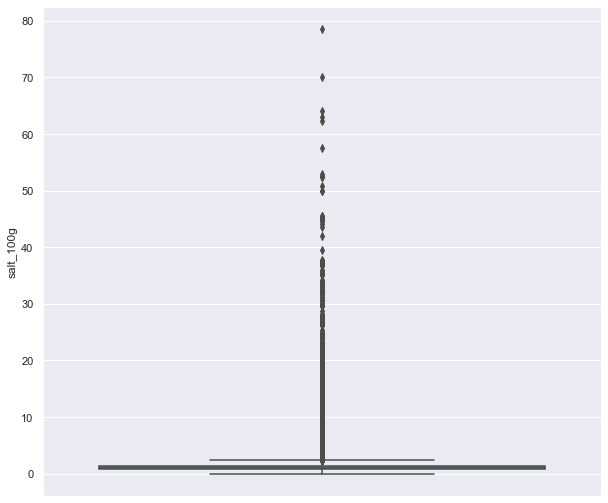

In [44]:
plt.figure(figsize = (10,9))
sns.boxplot( y=Produit_prep["salt_100g"] )
plt.show()

In [45]:
Produit_prep.isna().sum()

product_name                   0
brands                     12195
categories_en                  0
countries_en                  47
ingredients_text           10819
allergens                  27754
additives_en               21238
nutriscore_score            3779
nutriscore_grade            3779
pnns_groups_2                  0
energy-kcal_100g            8415
energy_100g                 2197
fat_100g                    2324
saturated-fat_100g          2578
trans-fat_100g             32270
cholesterol_100g           31995
carbohydrates_100g          2332
sugars_100g                 2557
fiber_100g                 17919
proteins_100g               2251
salt_100g                   2475
sodium_100g                 2475
calcium_100g               32091
iron_100g                  31996
nutrition-score-fr_100g     3779
dtype: int64

In [46]:
#selectionner les colonnes numeriques
Produit_prep_numerique = Produit_prep.select_dtypes(include=[np.number])
num_cols = Produit_prep_numerique.columns.values
print(num_cols)

['nutriscore_score' 'energy-kcal_100g' 'energy_100g' 'fat_100g'
 'saturated-fat_100g' 'trans-fat_100g' 'cholesterol_100g'
 'carbohydrates_100g' 'sugars_100g' 'fiber_100g' 'proteins_100g'
 'salt_100g' 'sodium_100g' 'calcium_100g' 'iron_100g'
 'nutrition-score-fr_100g']


In [47]:
len(num_cols)

16

In [48]:
# selectionner les colonnes catégorielles
Produit_prep_categ = Produit_prep.select_dtypes(exclude=[np.number])
categ_cols = Produit_prep_categ.columns.values
print(categ_cols)

['product_name' 'brands' 'categories_en' 'countries_en' 'ingredients_text'
 'allergens' 'additives_en' 'nutriscore_grade' 'pnns_groups_2']


In [49]:
num_cols

array(['nutriscore_score', 'energy-kcal_100g', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'trans-fat_100g', 'cholesterol_100g',
       'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
       'salt_100g', 'sodium_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g'], dtype=object)

In [50]:
num_colonnes = ['energy-kcal_100g', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'trans-fat_100g', 'cholesterol_100g',
       'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
       'salt_100g', 'sodium_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g']

In [51]:
len(categ_cols)

9

In [52]:
#Je remplis les valeurs nan par la médiane de la colonnes
for col in num_colonnes:
    Produit_prep[col].fillna(Produit_prep[col].median(), inplace = True)


C:\Users\agar.blohorn\anaconda3\lib\site-packages\pandas\core\series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [53]:
Produit_prep[num_cols].head()

,nutriscore_score,energy-kcal_100g,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
13,1.0,32.0,134.0,0.3,0.1,0.0,0.009,5.3,3.9,1.5,0.9,0.42,0.168,0.034,0.00096,1.0
35,1.0,143.0,598.0,12.7,1.0,0.0,0.009,3.9,1.0,1.5,1.9,0.27,0.108,0.034,0.00096,1.0
69,17.0,235.0,983.0,15.0,7.5,0.0,0.009,1.0,1.0,1.5,24.0,2.00,0.800,0.034,0.00096,17.0
88,1.0,64.0,268.0,2.3,2.3,0.0,0.009,1.8,1.4,1.5,3.7,0.40,0.160,0.034,0.00096,1.0
322,0.0,167.0,450.0,2.2,0.9,0.0,0.009,15.3,0.5,0.5,6.8,0.70,0.280,0.034,0.00096,0.0


In [54]:
dt.loc[125338]

code                                                                              0048107167271
url                                           http://world-en.openfoodfacts.org/product/0048...
creator                                                                               foodvisor
created_t                                                                            1561570771
created_datetime                                                           2019-06-26T17:39:31Z
last_modified_t                                                                      1597278255
last_modified_datetime                                                     2020-08-13T00:24:15Z
product_name                                                                   Vegan lean shake
generic_name                                                                                NaN
quantity                                                                       1.71 oz (48.5 g)
packaging                               

##  Exploration des données 

### Analyse univariée

Explorons la distribution de la variable cible et des variables similaires.

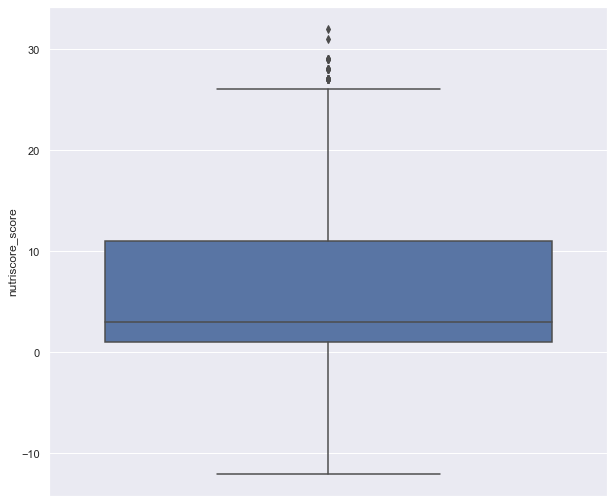

In [55]:
plt.figure(figsize = (10,9))
sns.boxplot( y=Produit_prep["nutriscore_score"])
plt.show()

La boite à moustache de la variable nutriscore indique une asymétrie à droite avec cinq valeurs atypiques. Ces valeurs atypique ont un score très élevée ce qui veut dire que cinq plats sont trés mal notés nutritionnellement. On remarque également qu'il y a plus de score mauvais que bons. 

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



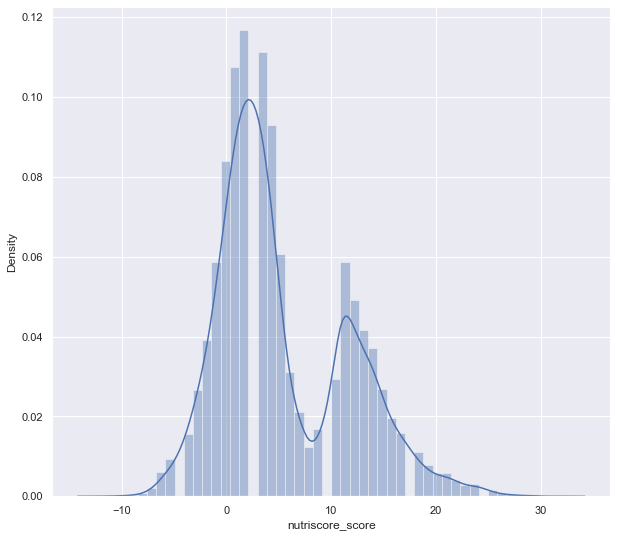

In [56]:
plt.figure(figsize = (10,9))
sns.distplot(Produit_prep["nutriscore_score"])
plt.show()

La distribution de la variable cible nutriscore montre deux tendances dans sa forme, deux bosses. Peut être deux groupes à reconnaitre

In [57]:
print("skewness :", Produit_prep["nutriscore_score"].skew() ,"kurtosis :" ,Produit_prep["nutriscore_score"].kurtosis() )

skewness : 0.7419763215788466 kurtosis : -0.09862968283326312


La mesure d'asymétrie est positive, la queue de la distribution s'étend légèrement vers la droite, vers des valeurs positives. La messure d'appalatissement est négative. La distribution est relativement plate. Avec deux bosses.

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\agar.blohorn\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\agar.bl

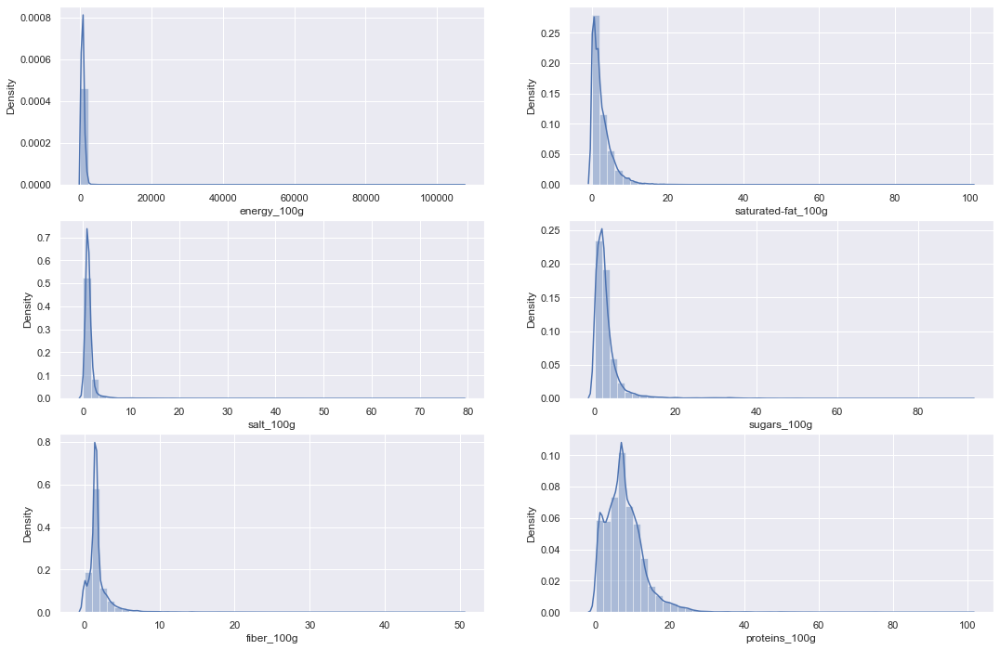

In [58]:
sns.set(rc={"figure.figsize": (18, 12)}); np.random.seed
subplot(3,2,1)
ax = sns.distplot(Produit_prep["energy_100g"])
subplot(3,2,2)
ax = sns.distplot(Produit_prep["saturated-fat_100g"])
subplot(3,2,3)
ax = sns.distplot(Produit_prep["salt_100g"])
subplot(3,2,4)
ax = sns.distplot(Produit_prep["sugars_100g"])
subplot(3,2,5)
ax = sns.distplot(Produit_prep["fiber_100g"])

subplot(3,2,6)
ax = sns.distplot(Produit_prep["proteins_100g"])
plt.show()

les distribution des variables teneur en sel, sucre, fibre, proteine, calories et graisse saturées ont toutes une distribution décalée à gauche de la médiane avec une queue qui s'étale vers la droite. La majorité des valeurs des données sont inférieurs à la moyenne.

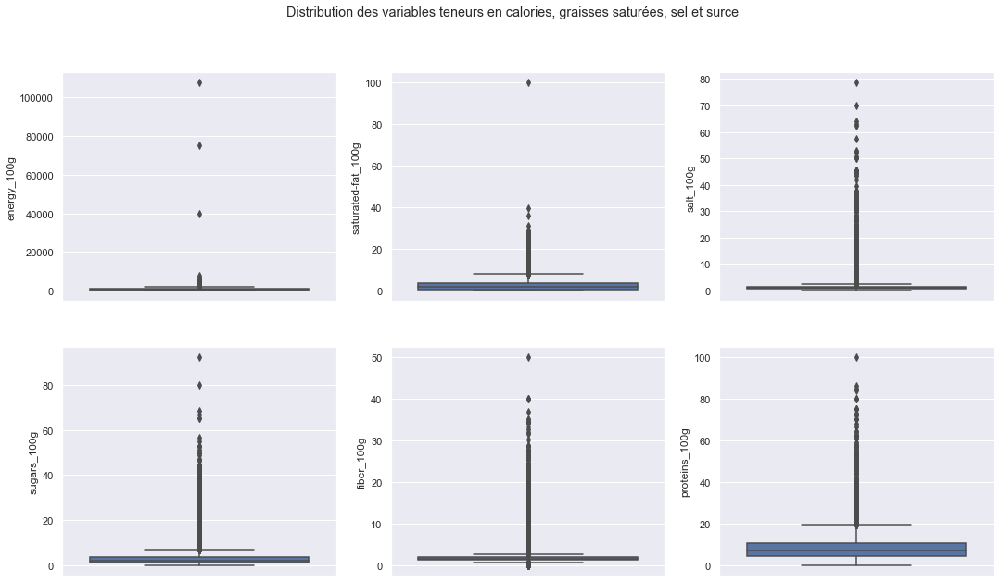

In [59]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Distribution des variables teneurs en calories, graisses saturées, sel et surce')
sns.boxplot(ax=axes[0, 0], y=Produit_prep["energy_100g"])
sns.boxplot(ax=axes[0, 1], y=Produit_prep["saturated-fat_100g"] )
sns.boxplot(ax=axes[0, 2], y=Produit_prep["salt_100g"])
sns.boxplot(ax=axes[1, 0], y=Produit_prep["sugars_100g"])
sns.boxplot(ax=axes[1, 1], y=Produit_prep["fiber_100g"] )
sns.boxplot(ax=axes[1, 2], y=Produit_prep["proteins_100g"])

Beaucoup de valeurs atypiques trés élevée

In [60]:
Pays = Produit_prep["countries_en"].value_counts().head(10)
Pays

France                22350
United States         15092
Spain                  2017
Germany                1848
Switzerland             570
Belgium                 531
United Kingdom          408
France,Germany          375
Belgium,France          322
France,Switzerland      275
Name: countries_en, dtype: int64

In [61]:
plt.figure(figsize = (10,9))
fig = px.pie(Pays, values = 'countries_en', names=Pays.index, title = 'Les pays dont les produits proviennent')
fig.show()

<Figure size 720x648 with 0 Axes>

In [62]:
Categorie = Produit_prep["categories_en"].value_counts().head(10)
plt.figure(figsize = (10,9))
fig = px.pie(Categorie, values = 'categories_en', names=Categorie.index)
fig.show()

<Figure size 720x648 with 0 Axes>

In [63]:
marque = Produit_prep["brands"].value_counts().head(10)
plt.figure(figsize = (10,9))
fig = px.pie(marque, values='brands', names=marque.index, title='Les marques contenant le plus de produits')
fig.show()

<Figure size 720x648 with 0 Axes>

In [64]:
marque = Produit_prep["nutriscore_grade"].value_counts().head(10)
plt.figure(figsize = (10,9))
fig = px.pie(marque, values='nutriscore_grade', names=marque.index, title='Répartition des nutriscores pour les plats préparés')
fig.show()

<Figure size 720x648 with 0 Axes>

Les nutriscores les plus nombreux sont les catégories b et c

### Analyse bivariée

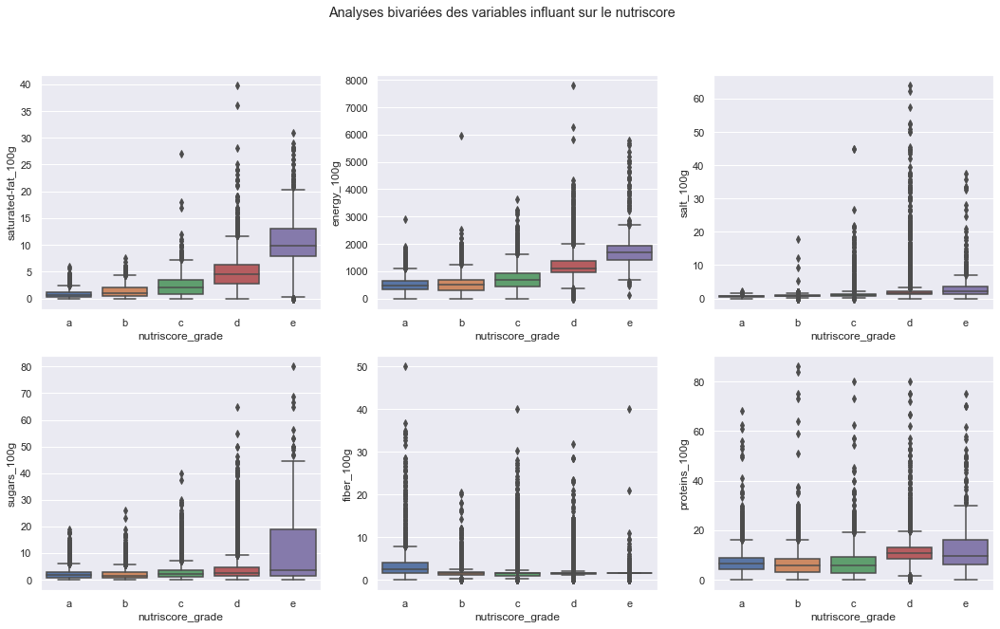

In [65]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Analyses bivariées des variables influant sur le nutriscore')
sns.boxplot(ax=axes[0, 0], x=Produit_prep["nutriscore_grade"], y=Produit_prep["saturated-fat_100g"], order = ['a','b','c','d','e'] )
sns.boxplot(ax=axes[0, 1], x=Produit_prep["nutriscore_grade"], y=Produit_prep["energy_100g"],order = ['a','b','c','d','e'])
sns.boxplot(ax=axes[0, 2], x=Produit_prep["nutriscore_grade"], y=Produit_prep["salt_100g"],order =  ['a','b','c','d','e'] )
sns.boxplot(ax=axes[1, 0], x=Produit_prep["nutriscore_grade"], y=Produit_prep["sugars_100g"], order = ['a','b','c','d','e'] )
sns.boxplot(ax=axes[1, 1], x=Produit_prep["nutriscore_grade"], y=Produit_prep["fiber_100g"],order = ['a','b','c','d','e']  )
sns.boxplot(ax=axes[1, 2], x=Produit_prep["nutriscore_grade"], y=Produit_prep["proteins_100g"], order = ['a','b','c','d','e'] )

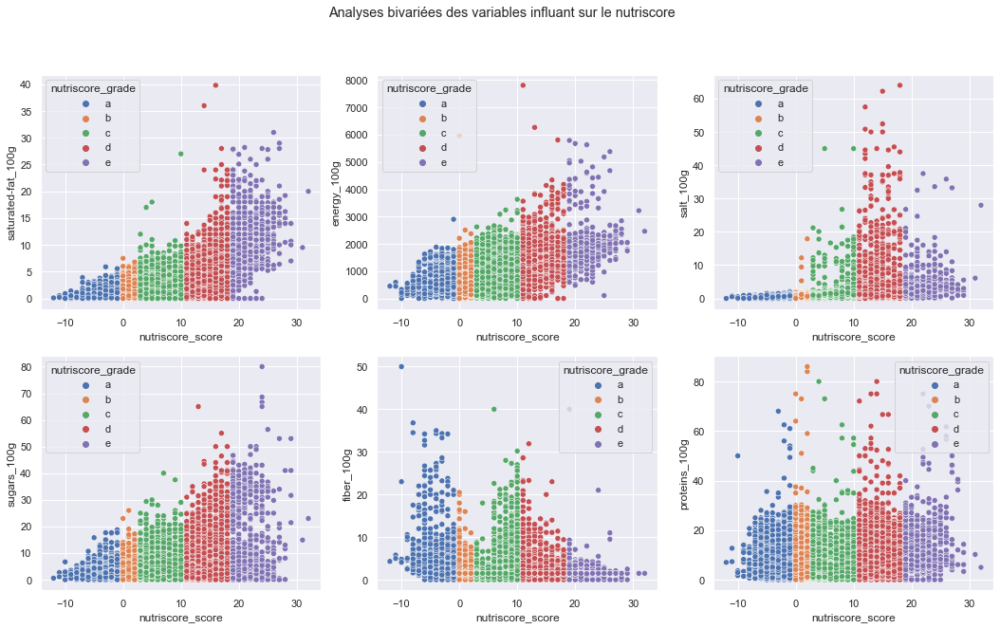

In [66]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Analyses bivariées des variables influant sur le nutriscore')
sns.scatterplot(data = Produit_prep,x="nutriscore_score", y="saturated-fat_100g",ax=axes[0, 0],hue = "nutriscore_grade", hue_order = ['a','b','c','d','e'])
sns.scatterplot(x="nutriscore_score", y="energy_100g",data = Produit_prep, ax=axes[0, 1],hue = "nutriscore_grade", hue_order = ['a','b','c','d','e'])
sns.scatterplot(x="nutriscore_score", y=Produit_prep["salt_100g"],data = Produit_prep,ax=axes[0, 2],hue = "nutriscore_grade", hue_order = ['a','b','c','d','e'] )
sns.scatterplot(x="nutriscore_score", y="sugars_100g",data = Produit_prep, ax=axes[1, 0],hue = "nutriscore_grade", hue_order = ['a','b','c','d','e'])
sns.scatterplot(x="nutriscore_score", y="fiber_100g",data = Produit_prep,ax=axes[1, 1],hue = "nutriscore_grade", hue_order = ['a','b','c','d','e'])
sns.scatterplot(x="nutriscore_score", y="proteins_100g",data = Produit_prep,ax=axes[1, 2],hue = "nutriscore_grade", hue_order = ['a','b','c','d','e'] )

<Figure size 720x648 with 0 Axes>

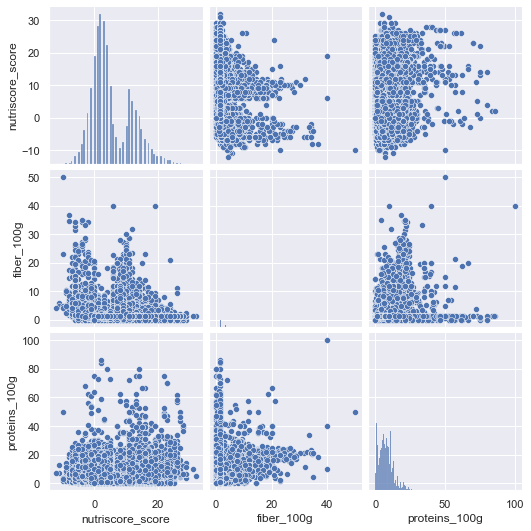

In [67]:
#Regardons le lien entre les variables considéré comme bonne pour la santé et le nutriscore_score 
plt.figure(figsize = (10,9))
sns.set()
sns.pairplot(Produit_prep, vars=['nutriscore_score','fiber_100g', 'proteins_100g'])
plt.show()

<Figure size 720x648 with 0 Axes>

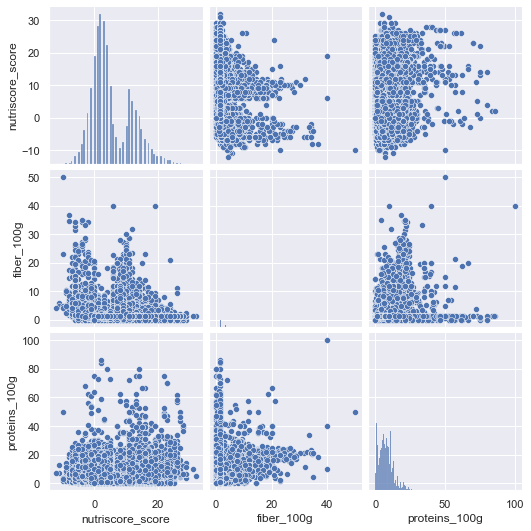

In [68]:
#Regardons le lien entre les variables considéré comme bonne pour la santé et le nutriscore_score 
plt.figure(figsize = (10,9))
sns.set()
sns.pairplot(Produit_prep, vars=['nutriscore_score','fiber_100g', 'proteins_100g'])
plt.show()

### Analyse multivariée

In [69]:
#Je trace la matrice de corrélation
Produit_prep_numerique.corr()

,nutriscore_score,energy-kcal_100g,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
nutriscore_score,1.000000,0.643550,0.655742,0.591982,0.693173,0.103302,0.018361,0.390843,0.333372,-0.127707,0.318665,0.332027,0.332171,0.370213,0.006827,1.000000
energy-kcal_100g,0.643550,1.000000,0.992321,0.441391,0.356505,0.074219,0.007394,0.390507,0.181019,0.142371,0.268186,0.134326,0.134310,0.029253,0.024669,0.643550
energy_100g,0.655742,0.992321,1.000000,0.464888,0.363214,0.074047,0.007382,0.407444,0.190371,0.147524,0.275001,0.142204,0.142174,0.029736,0.010532,0.655742
fat_100g,0.591982,0.441391,0.464888,1.000000,0.714297,0.137479,0.027936,0.074957,0.113422,-0.013555,0.303839,0.030973,0.030946,0.028789,-0.001471,0.591982
saturated-fat_100g,0.693173,0.356505,0.363214,0.714297,1.000000,0.132849,0.029397,0.094942,0.156787,-0.090194,0.307407,0.025811,0.025781,0.039837,-0.004561,0.693173
trans-fat_100g,0.103302,0.074219,0.074047,0.137479,0.132849,1.000000,0.000603,0.004925,0.007382,-0.023636,0.038988,0.013454,0.013454,0.001585,-0.000307,0.103302
cholesterol_100g,0.018361,0.007394,0.007382,0.027936,0.029397,0.000603,1.000000,-0.006945,0.008532,-0.012217,0.039370,0.092895,0.092876,0.000483,-0.000039,0.018361
carbohydrates_100g,0.390843,0.390507,0.407444,0.074957,0.094942,0.004925,-0.006945,1.000000,0.406629,0.357469,0.180673,0.257264,0.257294,0.014731,0.020512,0.390843
sugars_100g,0.333372,0.181019,0.190371,0.113422,0.156787,0.007382,0.008532,0.406629,1.000000,0.185861,0.019014,0.208852,0.209202,0.124115,0.031729,0.333372
fiber_100g,-0.127707,0.142371,0.147524,-0.013555,-0.090194,-0.023636,-0.012217,0.357469,0.185861,1.000000,0.216689,0.116131,0.116012,0.019551,0.010987,-0.127707


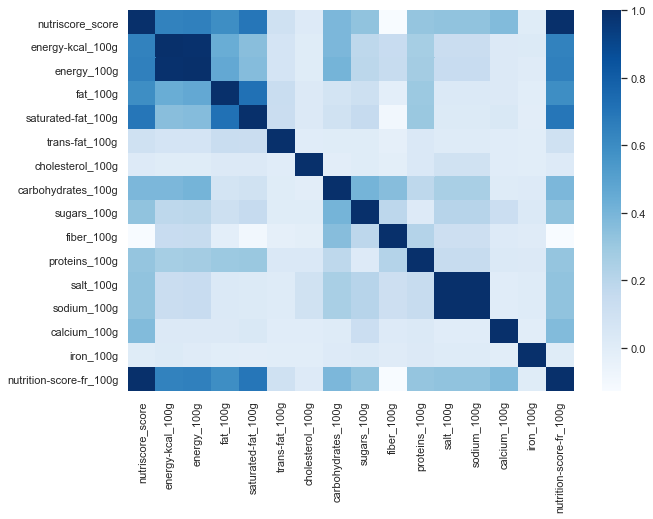

In [70]:
plt.figure(figsize = (10,7))
sns.heatmap(Produit_prep_numerique.corr(),cmap="Blues")
plt.show()

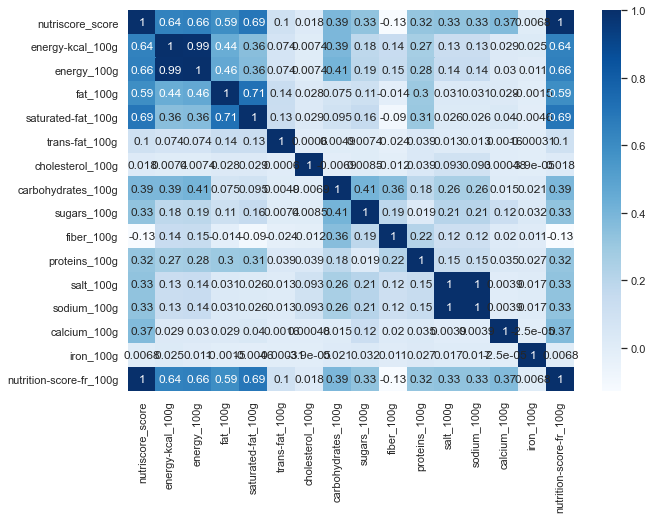

In [71]:
plt.figure(figsize = (10,7))
sns.heatmap(Produit_prep_numerique.corr(),cmap="Blues", annot = True)
plt.show()

Les variables qui sont corrélés avec le nutriscore sont les calories, les graisses et les graisses saturés. Il y a le carbohydrates avec le sucre, l'energie, les fibres, les proteines... Je vais extraires ces variables et leur appliquer une ACP, une réduction de dimensions afin de synthétiser l'informations et facilité l'apprentissage.

#### Test statistique

In [72]:
Test_data = Produit_prep[["nutriscore_score", "saturated-fat_100g", "energy_100g", "fiber_100g"]].dropna()

In [73]:
from scipy import stats
stats.pearsonr(Test_data["nutriscore_score"], Test_data["saturated-fat_100g"])

(0.6931458097728007, 0.0)

In [74]:
stats.spearmanr(Test_data["nutriscore_score"], Test_data["saturated-fat_100g"])

SpearmanrResult(correlation=0.5911017590413659, pvalue=0.0)

In [75]:
stats.spearmanr(Test_data["nutriscore_score"], Test_data["energy_100g"])

SpearmanrResult(correlation=0.6212621682085232, pvalue=0.0)

In [76]:
stats.spearmanr(Test_data["nutriscore_score"], Test_data["fiber_100g"])

SpearmanrResult(correlation=-0.16872379770017554, pvalue=7.380365218297487e-274)

#### ACP

In [77]:
ACP = Produit_prep

In [78]:
ACP["proteins_100g"].corr(ACP["saturated-fat_100g"])

0.30577022432347956

In [79]:
ACP.head(30)

,product_name,brands,categories_en,countries_en,ingredients_text,allergens,additives_en,nutriscore_score,nutriscore_grade,pnns_groups_2,energy-kcal_100g,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
13,Salade de carottes râpées,NaN,"Meals,Prepared vegetables,Grated carrots,Seaso...",France,NaN,NaN,NaN,1.0,b,One-dish meals,32.000000,134.0,0.300000,0.100000,0.0,0.0090,5.300000,3.900000,1.500,0.90000,0.420000,0.168000,0.0340,0.000960,1.0
35,Salade de macedoine de légumes,NaN,"Meals,Prepared vegetables,Starters,Cold starte...",France,NaN,NaN,NaN,1.0,b,One-dish meals,143.000000,598.0,12.700000,1.000000,0.0,0.0090,3.900000,1.000000,1.500,1.90000,0.270000,0.108000,0.0340,0.000960,1.0
69,CORNED BEEF,NaN,"Canned foods,Meats,Meals,Meat-based products,M...",France,NaN,NaN,NaN,17.0,d,One-dish meals,235.000000,983.0,15.000000,7.500000,0.0,0.0090,1.000000,1.000000,1.500,24.00000,2.000000,0.800000,0.0340,0.000960,17.0
88,Salade Grecque,NaN,"Meals,Salads,Prepared salads",France,NaN,NaN,NaN,1.0,b,One-dish meals,64.000000,268.0,2.300000,2.300000,0.0,0.0090,1.800000,1.400000,1.500,3.70000,0.400000,0.160000,0.0340,0.000960,1.0
322,Blanquette de Volaille et son Riz,Comme J’aime,"Meals,Meat-based products,Meals with meat,Poul...",France,"Riz précuit 40,4 % (eau, riz, huile de colza, ...",NaN,"E14XX - Modified Starch,E451 - Triphosphates,E...",0.0,b,One-dish meals,167.000000,450.0,2.200000,0.900000,0.0,0.0090,15.300000,0.500000,0.500,6.80000,0.700000,0.280000,0.0340,0.000960,0.0
323,Raviolini au Fromage de chèvre et Pesto,Comme J’Aime,"Meals,Microwave meals",France,NaN,NaN,NaN,2.0,b,One-dish meals,167.000000,455.0,4.200000,2.100000,0.0,0.0090,12.500000,1.400000,1.800,4.40000,0.600000,0.240000,0.0340,0.000960,2.0
375,Pizza prosciutto,Sodebo,"Meals,Pizzas pies and quiches,Pizzas",France,NaN,NaN,NaN,5.0,c,Pizza pies and quiche,197.000000,824.0,4.700000,2.900000,0.0,0.0090,25.000000,2.100000,1.500,11.00000,1.500000,0.600000,0.0340,0.000960,5.0
400,Quiche Lorraine,Kirkland Signature,"Meals,Pizzas pies and quiches,Quiches,Lorraine...",Canada,INGRÉDIENTS : GARNITURE (SUBSTANCES LAITIÈRES....,NaN,"E235 - Natamycin,E250 - Sodium nitrite,E281 - ...",2.0,b,Pizza pies and quiche,114.000000,478.0,6.790000,2.860000,0.0,0.0107,7.860000,0.714000,0.357,5.36000,0.499000,0.200000,0.0286,0.000643,2.0
481,Tripoux,NaN,"Meals,Meat-based products,Meals with meat,Shee...",France,NaN,NaN,NaN,15.0,d,One-dish meals,402.000000,1682.0,5.200000,0.400000,0.0,0.0090,2.400000,1.900000,1.500,4.30000,10.000000,4.000000,0.0340,0.000960,15.0
567,Céleri Rémoulade,NaN,"Meals,Prepared vegetables,Celeriac in remoulad...",France,NaN,NaN,NaN,3.0,c,One-dish meals,145.000000,607.0,13.000000,1.000000,0.0,0.0090,3.500000,2.000000,1.500,2.00000,0.800000,0.320000,0.0340,0.000960,3.0


In [80]:
asuppr = ["product_name","ingredients_text","nutriscore_grade","nutriscore_score","brands", "categories_en", "countries_en","allergens","additives_en","pnns_groups_2","energy-kcal_100g","fat_100g","trans-fat_100g","cholesterol_100g","carbohydrates_100g","sodium_100g","calcium_100g","iron_100g","nutrition-score-fr_100g"]

In [81]:
ACP = ACP.drop(asuppr,axis = 1)

In [82]:
data_ACP = ACP.fillna(ACP.median())

In [83]:
X = data_ACP.values

In [84]:
from sklearn import preprocessing
#  nos données seront centrés

std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

In [85]:
pd.DataFrame(data = X_scaled, columns = ACP.columns).head()

,energy_100g,saturated-fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g
0,-0.816634,-0.872231,0.211260,-0.173927,-1.260496,-0.400295
1,-0.223794,-0.546014,-0.467241,-0.173927,-1.077542,-0.464526
2,0.268110,1.809995,-0.467241,-0.173927,2.965735,0.276274
3,-0.645426,-0.074812,-0.373655,-0.173927,-0.748226,-0.408859
4,-0.412890,-0.582260,-0.584224,-0.682157,-0.181069,-0.280397


In [86]:
from sklearn import decomposition

pca = decomposition.PCA(n_components=2)
PCA = pca.fit(X_scaled)

In [87]:
print(pca.explained_variance_ratio_)
print(pca.explained_variance_ratio_.sum())

[0.30038336 0.19354827]
0.49393162383709827


La première composante explique environ un tiers de la variance observée dans les données et la deuxième 19.3%. Au total, ces deux composantes expliquent 49% de la variance totale.

In [88]:
### projeter X sur les composantes principales
X_projected = pca.transform(X_scaled)

In [89]:
principalDf = pd.DataFrame(data = X_projected
             , columns = ['principal component 1', 'principal component 2'])

In [90]:
principalDf.head()

,principal component 1,principal component 2
0,-1.540532,-0.562535
1,-1.228126,0.011119
2,2.297821,1.585016
3,-1.026150,0.174927
4,-1.026740,0.361919


In [91]:
target = Produit_prep["nutriscore_grade"]

In [92]:
target.head()

13     b
35     b
69     d
88     b
322    b
Name: nutriscore_grade, dtype: object

In [93]:
finalDf = pd.concat([principalDf, target], axis = 1)
finalDf.head(5)

,principal component 1,principal component 2,nutriscore_grade
0,-1.540532,-0.562535,NaN
1,-1.228126,0.011119,NaN
2,2.297821,1.585016,NaN
3,-1.026150,0.174927,NaN
4,-1.026740,0.361919,NaN


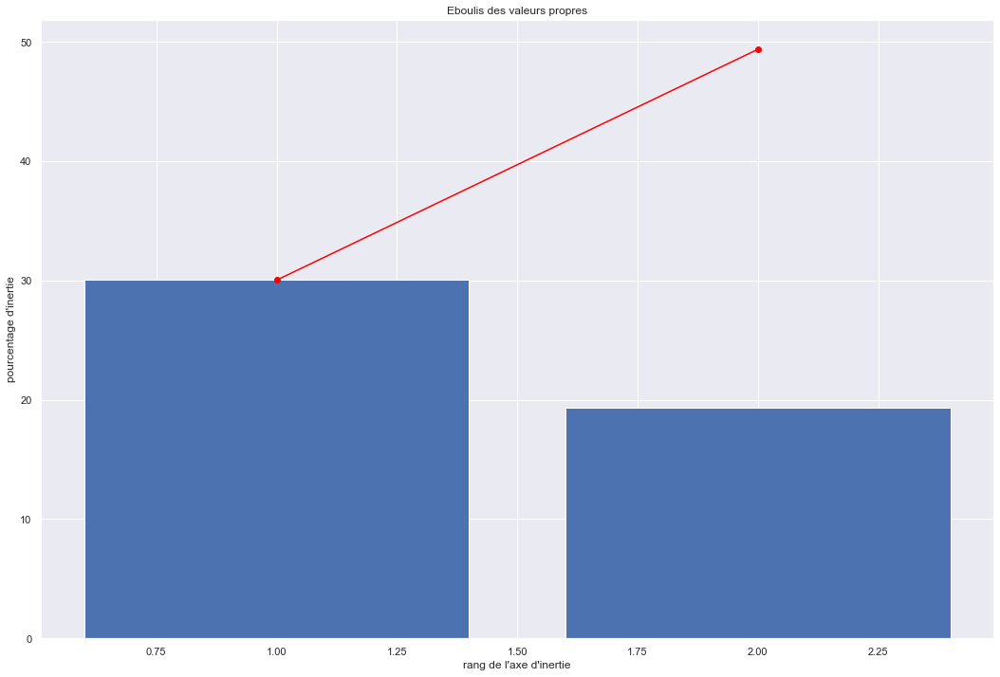

In [94]:
display_scree_plot(pca)

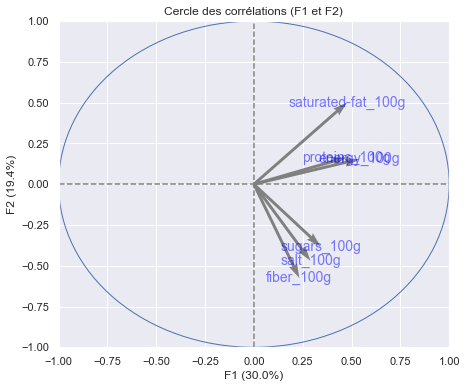

In [95]:
# Cercle des corrélations
pcs = pca.components_
display_circles(pcs, 2, pca, [(0,1),(2,3),(4,5)], labels = ACP.columns)


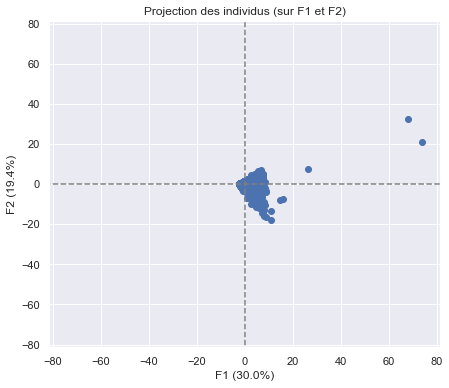

In [96]:
# Projection des individus
X_projected = pca.transform(X_scaled)
display_factorial_planes(X_projected, 2, pca, [(0,1),(2,3),(4,5)])

plt.show()

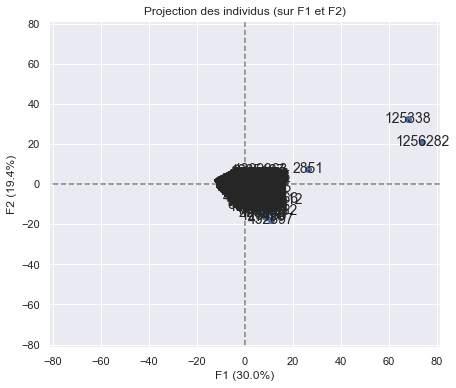

In [97]:
# Projection des individus
X_projected = pca.transform(X_scaled)
display_factorial_planes(X_projected, 2, pca, [(0,1),(2,3),(4,5)], labels = Produit_prep.index)

plt.show()

L'analyse en compostance principal indique quelques valeurs atypiques, trois en particulier qui sont beaucoup trop éloignée des données du centre. Je vais les supprimer et relançer l'acp pour avoir un resulat juste

In [98]:
Produit_prep["product_name"].loc[125338]

'Vegan lean shake'

In [99]:
data["url"].loc[125338]

'http://world-en.openfoodfacts.org/product/0048107167271/vegan-lean-shake-gnc'

In [100]:
data["url"].loc[1256282]

'http://world-en.openfoodfacts.org/product/8015673024897/trancio-verace-con-speck-italpizza'

In [101]:
Produit_prep.loc[432697]

product_name                         tartelettes à la Fraise
brands                                                  €co+
categories_en              Pies,Tartlets,Strawberry tartlets
countries_en                                          France
ingredients_text                                         NaN
allergens                                                NaN
additives_en                                             NaN
nutriscore_score                                         NaN
nutriscore_grade                                         NaN
pnns_groups_2                          Pizza pies and quiche
energy-kcal_100g                                         435
energy_100g                                             1820
fat_100g                                                  13
saturated-fat_100g                                       1.7
trans-fat_100g                                             0
cholesterol_100g                                       0.009
carbohydrates_100g      

In [102]:
data["url"].loc[432697]

'http://world-en.openfoodfacts.org/product/18903039/tartelettes-a-la-fraise-co'

In [103]:
ACP.shape

(47071, 6)

In [104]:
ACP.columns

Index(['energy_100g', 'saturated-fat_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g'],
      dtype='object')

In [117]:
colonnes = ['fat_100g', 'saturated-fat_100g',
       'trans-fat_100g', 'cholesterol_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'calcium_100g', 'iron_100g']
somme = Produit_prep[colonnes].sum(axis=1)
ProduitPrepare = Produit_prep
ProduitPrepare.drop(Produit_prep.loc[Produit_prep[colonnes].sum(axis=1)>100].index, inplace = True)
ProduitPrepare.shape

C:\Users\agar.blohorn\anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(44463, 25)

In [118]:
ACPbis = ProduitPrepare
ACPbis.shape

(44463, 25)

In [119]:
ACPbis=ACPbis[~ACPbis.index.isin([1256282,125338,2851])]

In [120]:
ACPbis.shape

(44461, 25)

In [121]:
ACPbis = ACPbis.drop(asuppr,axis = 1)
data_ACPbis = ACPbis.fillna(ACPbis.median())
Xbis = data_ACPbis.values

In [122]:
from sklearn import preprocessing
#  nos données seront centrés

std_scalebis = preprocessing.StandardScaler().fit(Xbis)
X_scaledbis = std_scale.transform(Xbis)

In [123]:
from sklearn import decomposition

pcabis = decomposition.PCA(n_components=6)
PCAbis = pcabis.fit(X_scaledbis)

print(pcabis.explained_variance_ratio_)
print(pcabis.explained_variance_ratio_.sum())

[0.40937759 0.18392428 0.14915805 0.11831276 0.09178152 0.04744578]
1.0


In [124]:
### projeter X sur les composantes principales
X_projectedbis = pcabis.transform(X_scaledbis)

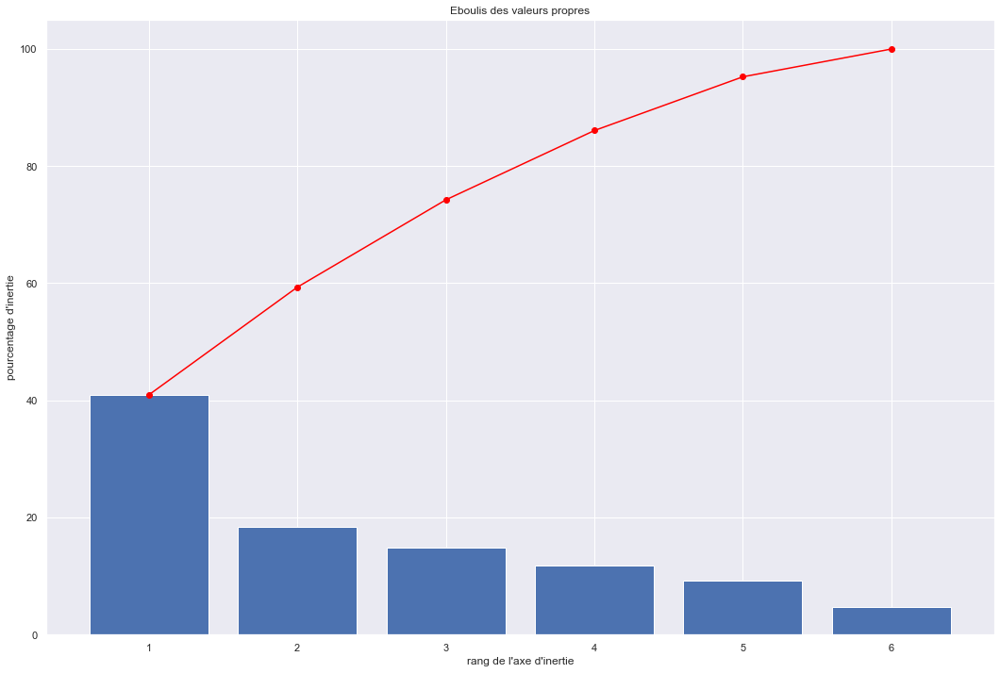

In [125]:
display_scree_plot(pcabis)

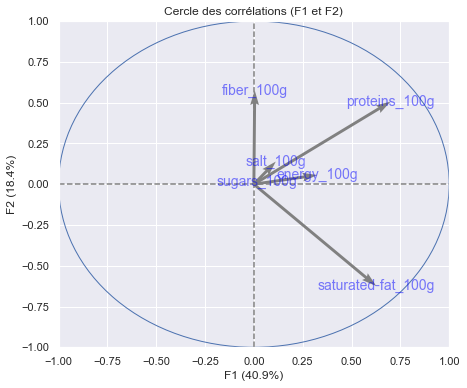

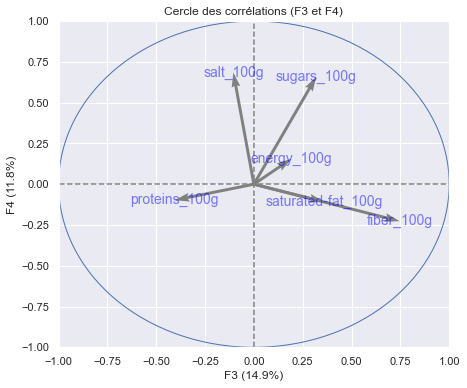

In [126]:
# Cercle des corrélations
pcsbis = pcabis.components_
display_circles(pcsbis, 5, pcabis, [(0,1),(2,3),(4,5)], labels = ACPbis.columns)

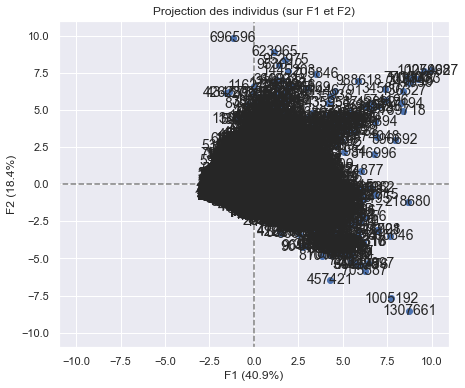

In [127]:
# Projection des individus
X_projectedbis = pcabis.transform(X_scaledbis)
display_factorial_planes(X_projectedbis, 2, pcabis, [(0,1),(2,3),(4,5)],Produit_prep.index)

plt.show()

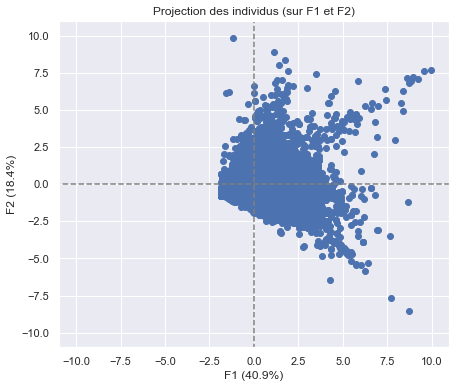

In [128]:
# Projection des individus
X_projectedbis = pcabis.transform(X_scaledbis)
display_factorial_planes(X_projectedbis, 2, pcabis, [(0,1),(2,3),(4,5)])

plt.show()

**Conclusion :** 
Dans cette analyse, je me suis focalisé sur les données nutritionnelles influant le nutriscore afin de comprendre le contenu des plats préparés. La variable nutriscore présente une distribution avec deux bosses, deux distributions normale. Les grades b et c sont les grades les plus représentatifs des plats préparés.
Je confirme que les graisses-saturées, le sel et le sucre "et les calories ont un effet négatifs sur le nutriscore et les fibres ont un effet positifs. Cependant, au vu de l'analyse je ne peut pas me prononcé au sujet des proteines. 
Les resultats de l'ACP nous indique deux groupes de nutriments pouvant caractériser les plats préparés :
- les plats avec des fibres
- les plats avec des graisses saturées


In [129]:
Nlp_data = pd.DataFrame(Produit_prep, columns =['product_name','ingredients_text','nutriscore_grade','nutriscore_score','energy_100g',
       'saturated-fat_100g',
      'sugars_100g', 'fiber_100g', 'proteins_100g',
       'salt_100g'])

In [130]:
Nlp_data.head(5)

,product_name,ingredients_text,nutriscore_grade,nutriscore_score,energy_100g,saturated-fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g
13,Salade de carottes râpées,NaN,b,1.0,134.0,0.1,3.9,1.5,0.9,0.42
35,Salade de macedoine de légumes,NaN,b,1.0,598.0,1.0,1.0,1.5,1.9,0.27
69,CORNED BEEF,NaN,d,17.0,983.0,7.5,1.0,1.5,24.0,2.00
88,Salade Grecque,NaN,b,1.0,268.0,2.3,1.4,1.5,3.7,0.40
322,Blanquette de Volaille et son Riz,"Riz précuit 40,4 % (eau, riz, huile de colza, ...",b,0.0,450.0,0.9,0.5,0.5,6.8,0.70


In [131]:
Nlp_data.to_csv('nlp_data.csv')